DSC160 Data Science and the Arts - Twomey - Spring 2020 - [dsc160.roberttwomey.com](http://dsc160.roberttwomey.com)

# Exercise 2: Audio Classification with MFCCs

This exercise walks you through feature extraction and genre classification based on MFCCs, using audio frames extracted from two instances of distinct audio styles (classical and rap music).

It has two parts:
- [Part 1](#Part-1:-Genre-Recognition). In this part you will load two audio files as genre examples, extract MFCC features from each, and implement a simple SVM classifier.
  - [Step 1 - Load Files and Display Audio](#Step-1:-Load-Files-and-Display-Audio)
  - [Step 2 - Extract Features](#Step-2:-Extract-Features)
  - [Step 3 - Train a Classifier](#Step-3:-Train-a-Classifier)
  - [Step 4 - Run the Classifier](#Step-4:-Run-the-Classifier)
- [Part 2](#Part-2:-Extension). In this part you will extend the work from Part 1, either creating a new classifier using new genre examples and training examples from your own music collection, implementing a new classifier method, or experimenting with different features for the SVM and existing examples.
  - [Part 2A - Code for your Extension](#2A.-Code-for-Extension)
  - [Part 2B - Discussion of Results](#2B.-Discussion-of-Results)
  
Once you have completed both parts, you will submit your completed notebook as a pdf to gradescope for grading.

Note: this is a simplified genre classification example. For a more comprehensive approach combining timbral, beat, and pitch features, see Tzanetakis and Cook ['Musical Genre Classification of Audio Signal'](https://pdfs.semanticscholar.org/4ccb/0d37c69200dc63d1f757eafb36ef4853c178.pdf) from IEEE Transactions on Audio and Speech Processing 2002. Many of the techniques described in that paper can be implemented using librosa and our numpy/scipy toolkits for your own Project 1.

## Setup

Import necessary modules:

In [60]:
%matplotlib inline

import matplotlib.pyplot as plt
import seaborn

import librosa
import librosa.display

from IPython.display import Audio

import requests
import os

import sklearn
import numpy as np

import pandas as pd

## Part 1: Genre Recognition
(50 points total)

This section walks you through three steps: 
1. Load and Display Audio Files
2. Extracting features from an audio signal.
3. Training a genre classifier.
4. Using the classifier to classify the genre in a song.

### Step 1: Load Files and Display Audio
(10 points)

We will use two audio pieces as exemplars of distinct audio genres:

- Johannes Brahms' ['Hungarian Dance #5 in G Minor'](https://www.youtube.com/watch?v=3X9LvC9WkkQ) (1885) 
- Busta Rhmyes' ['Hits for Days feat. J Holiday'](https://www.youtube.com/watch?v=B6bt3gWLV5g) (2016) 
  
These have both been added to the course repository in an `audio` subdirectory under the current path:
- `audio/brahms_hungarian_dance_5.mp3`
- `audio/busta_rhymes_hits_for_days.mp3`

Using [`librosa.load`](https://librosa.github.io/librosa/generated/librosa.core.load.html), load 120 seconds of Brahms :

In [2]:
brahm, sr_brahm = librosa.load('audio/brahms_hungarian_dance_5.mp3', duration=120)
brahm

/opt/anaconda3/lib/python3.7/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


array([0.        , 0.        , 0.        , ..., 0.10809326, 0.10418701,
       0.09970093], dtype=float32)

Using `librosa.display.waveplot`, plot the time-domain waveform of the audio signal for Brahms:

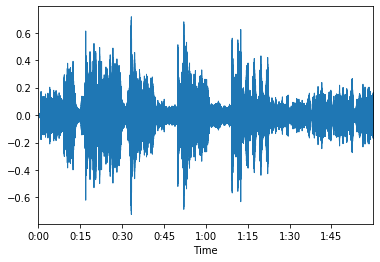

In [3]:
librosa.display.waveplot(brahm, sr=sr_brahm)

Using the IPython.display Audio class, play the audio file:

In [4]:
Audio(data=brahm, rate=sr_brahm)

Using [`librosa.feature.melspectogram`](https://librosa.github.io/librosa/generated/librosa.feature.melspectrogram.html), [`librosa.power_to_db`](https://librosa.github.io/librosa/generated/librosa.core.power_to_db.html), and [`librosa.display.specshow`](https://librosa.github.io/librosa/generated/librosa.display.specshow.html), calculate and display the mel spectogram with a logarithmic magnitude scale:

In [5]:
# calculate mel spectogram
ms = librosa.feature.melspectrogram(brahm, sr=sr_brahm)
# convert spectogram to log spectogram with power_to_db
ls = librosa.power_to_db(ms)

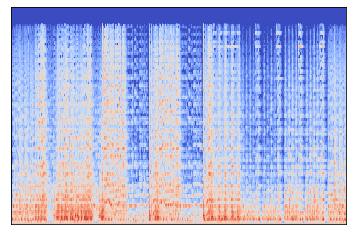

In [6]:
# show spectogram
librosa.display.specshow(ls)

Repeat the above steps for the Busta Rhymes song. 

Load the file:

In [7]:
# your code here
busta, sr_busta = librosa.load('audio/busta_rhymes_hits_for_days.mp3', duration=120)
busta

/opt/anaconda3/lib/python3.7/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


array([0.       , 0.       , 0.       , ..., 0.4000244, 0.388031 ,
       0.3959961], dtype=float32)

Display the waveform:

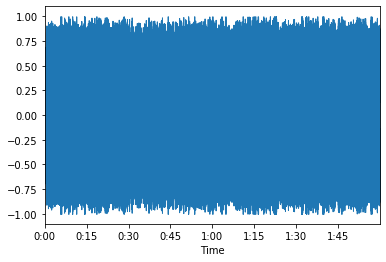

In [8]:
# your code here
librosa.display.waveplot(busta, sr=sr_busta)

Play the audio file:

In [9]:
# your code here
Audio(data=busta, rate=sr_busta)

Calculate and display the mel spectogram with a logarithmic magnitude scale:

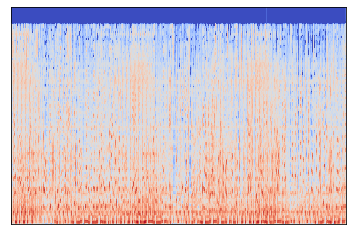

In [10]:
# calculate
ms = librosa.feature.melspectrogram(busta, sr=sr_busta)
ls = librosa.power_to_db(ms)
# display
librosa.display.specshow(ls)

Do you notice any difference between the wave form or spectogram for the classical and rap song? Is so, what? 

```The rap song has more warmth throughout, while the classical song has much more variation in color.```

### Step 2: Extract Features

(10 points)

We are going to work with MFCCs. For each of your audio files (starting with Brahms), use [`librosa.feature.mfcc`](https://librosa.github.io/librosa/generated/librosa.feature.mfcc.html) to calculate the MFCCs.

(Note: you can experiment with `n_mfcc` to select a different number of coefficients, e.g. 12)

Start with Brahms, using 12 coefficients, inputting the Brahms time series and Brahms sample rate as the arguments to the mfcc function.

In [11]:
# your code here
mfcc_brahms = librosa.feature.mfcc(brahm, sr=sr_brahm, n_mfcc=12)

Note: We transpose the result to accommodate scikit-learn which assumes that each row is one observation, and each column is one feature dimension:

In [12]:
mfcc_brahms = mfcc_brahms.T
mfcc_brahms.shape

(5168, 12)

Using [`sklearn.preprocessing.StandardScaler`](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html), scale the features to have zero mean and unit variance:

In [13]:
# your code here
mfcc_brahms_scaled = sklearn.preprocessing.scale(mfcc_brahms, axis=0)


/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/data.py:172: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/data.py:189: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


Verify that the scaling worked (e.g. do we have a mean close to zero and std deviation close to 1 for each feature?):

In [14]:
mfcc_brahms_scaled.mean(axis=0)

array([ 4.9172680e-08, -9.1459915e-09,  2.4773756e-08, -9.9879296e-09,
        1.0893302e-08,  2.1884638e-08, -5.3791808e-08, -1.0714535e-08,
       -3.0955665e-08, -2.5991252e-08,  4.9362980e-09,  2.7968510e-09],
      dtype=float32)

In [15]:
mfcc_brahms_scaled.std(axis=0)

array([1.0000001, 1.0000002, 1.0000005, 1.       , 0.9999999, 1.0000001,
       1.0000004, 1.0000007, 0.9999986, 0.9999989, 0.9999982, 1.000001 ],
      dtype=float32)

Repeat these calculations for Busta Rhymes. Use [`librosa.feature.mfcc`](https://librosa.github.io/librosa/generated/librosa.feature.mfcc.html) to calculate the MFCCs, inputting the Busta time series and Busta sample rate as the arguments to the mfcc function.

In [16]:
mfcc_busta = librosa.feature.mfcc(busta, sr=sr_busta, n_mfcc=12)

Note: Transpose the result to accommodate scikit-learn which assumes that each row is one observation, and each column is one feature dimension:

In [17]:
mfcc_busta = mfcc_busta.T
mfcc_busta.shape

(5168, 12)

Scale the resulting MFCC features to have approximately zero mean and unit variance. Re-use the scaler from above.

In [20]:
# your code here
mfcc_busta_scaled = sklearn.preprocessing.scale(mfcc_busta, axis=0)

/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/data.py:172: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/data.py:189: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


Verify that the mean of the MFCCs for the second audio file is approximately equal to zero and the variance is approximately equal to one.

In [21]:
mfcc_busta_scaled.mean(axis=0)

array([ 6.0319718e-09,  1.1579540e-08,  7.3496631e-09, -1.2415712e-08,
        1.6636939e-08, -4.5556955e-10, -3.5984229e-09,  1.3237467e-08,
       -1.2017810e-08,  8.2809857e-09,  1.3378751e-08, -1.8453450e-08],
      dtype=float32)

In [22]:
mfcc_busta_scaled.std(axis=0)

array([0.9999998 , 1.0000008 , 0.9999992 , 0.99999964, 1.0000001 ,
       1.0000013 , 1.0000005 , 0.99999994, 0.9999988 , 0.99999964,
       0.99999976, 1.0000004 ], dtype=float32)

### Step 3: Train a Classifier

(15 points)

Concatenate all of the scaled feature vectors into one feature table using [`np.vstack`](https://docs.scipy.org/doc/numpy/reference/generated/numpy.vstack.html).

In [85]:
# your code here
features = np.vstack([mfcc_brahms_scaled, mfcc_busta_scaled])
pd.DataFrame(features)

,0,1,2,3,4,5,6,7,8,9,10,11
0,-3.467556,-6.372368,0.348301,-5.543731,0.323727,-1.971002,0.520327,-1.087525,0.626056,-0.473105,0.558308,0.220778
1,-3.467556,-6.372368,0.348301,-5.543731,0.323727,-1.971002,0.520327,-1.087525,0.626056,-0.473105,0.558308,0.220778
2,-3.467556,-6.372368,0.348301,-5.543731,0.323727,-1.971002,0.520327,-1.087525,0.626056,-0.473105,0.558308,0.220778
3,-3.467556,-6.372368,0.348301,-5.543731,0.323727,-1.971002,0.520327,-1.087525,0.626056,-0.473105,0.558308,0.220778
4,-3.467556,-6.372368,0.348301,-5.543731,0.323727,-1.971002,0.520327,-1.087525,0.626056,-0.473105,0.558308,0.220778
...,...,...,...,...,...,...,...,...,...,...,...,...
10331,0.419191,-0.545736,-0.199803,-0.608509,-0.454301,0.792599,-0.155232,0.574780,-0.072082,1.207040,-0.190437,-0.500939
10332,0.077263,-0.986048,0.131791,-0.297327,-0.368623,1.076465,0.331512,1.072850,-0.357652,0.515329,-0.712805,-1.374472
10333,0.130373,-1.186078,-0.081456,-0.250256,-0.302669,0.746625,-0.648927,0.232975,-1.161119,0.350526,-1.194807,-2.277524
10334,0.109695,-1.283806,-0.253635,-0.185152,-0.436647,0.296931,-0.867168,0.264403,-0.778241,0.549017,-1.167519,-2.103072


In [74]:
features.shape

(10336, 12)

Construct a vector of ground-truth labels using [`np.concatenate`](https://docs.scipy.org/doc/numpy/reference/generated/numpy.concatenate.html), where 0 refers to the first audio file, and 1 refers to the second audio file. (use `np.zeros` and `np.ones` for brahms and busta rhymes)

In [86]:
labels = np.concatenate((np.zeros(len(mfcc_brahms_scaled)), np.ones(len(mfcc_busta_scaled))))
pd.Series(labels)

0        0.0
1        0.0
2        0.0
3        0.0
4        0.0
        ... 
10331    1.0
10332    1.0
10333    1.0
10334    1.0
10335    1.0
Length: 10336, dtype: float64

Create a classifer model object using sklearn's Support Vector Machine [`sklearn.svm.SVC`](https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html):

In [76]:
# Support Vector Machine
model = sklearn.svm.SVC()

Train the classifier with your test data and labels using [`SVC.fit`](https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html#sklearn.svm.SVC.fit):

In [77]:
# your code here
model.fit(features,labels)

SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
    kernel='rbf', max_iter=-1, probability=False, random_state=None,
    shrinking=True, tol=0.001, verbose=False)

### Step 4: Run the Classifier

(15 points)

To test the classifier, we will extract an unused 10-second segment from the earlier audio fields as test excerpts:

In [28]:
x_brahms_test, fs_brahms = librosa.load('audio/brahms_hungarian_dance_5.mp3', duration=10, offset=120)

/opt/anaconda3/lib/python3.7/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


In [29]:
x_busta_test, fs_busta = librosa.load('audio/busta_rhymes_hits_for_days.mp3', duration=10, offset=120)

/opt/anaconda3/lib/python3.7/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


Display the waveform and listen to the audio for both of the test excerpts using `librosa.display.waveplot` and 
`Audio`. 

Start with Brahms test (wave plot and audio player):

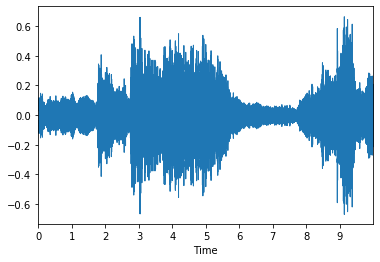

In [30]:
# wave plot
librosa.display.waveplot(x_brahms_test, sr=sr_brahm)
# audio playback
Audio(data=x_brahms_test, rate=sr_brahm)

Next Busta test (waveplot and audio player):

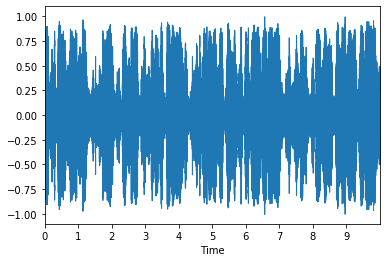

In [31]:
# wave plot
librosa.display.waveplot(x_busta_test, sr=sr_busta)
# audio playback
Audio(data=x_busta_test, rate=sr_busta)

Compute MFCCs from both of the test audio excerpts folowing above using `librosa.feature.mfcc`:

In [32]:
# calculate brahms test mfccs
mfcc_brahms_test = librosa.feature.mfcc(x_brahms_test, sr=sr_brahm, n_mfcc=12)

In [33]:
# calculate busta rhymes test mfccs
mfcc_busta_test = librosa.feature.mfcc(x_busta_test, sr=sr_busta, n_mfcc=12)

Scale the test sample MFCCs using the previous scaler:

In [40]:
# your code here
mfcc_brahms_test_scaled = sklearn.preprocessing.scale(mfcc_brahms, axis=0)
mfcc_busta_test_scaled = sklearn.preprocessing.scale(mfcc_busta, axis=0)

/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/data.py:172: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/data.py:189: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/data.py:172: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/data.py:189: UserWarning: Numerical

In [92]:
# your code here
mfcc_brahms_test_scaled.shape

(5168, 12)

Concatenate all test features together using `np.vstack`:

In [93]:
test_features = np.vstack((mfcc_brahms_test_scaled, mfcc_busta_test_scaled))

Concatenate all test labels together (using `np.concatenate`, with `np.zeros` for brahms and `np.ones` for busta rhymes):

In [94]:
test_labels = np.concatenate((np.zeros(len(mfcc_brahms_test_scaled)), np.ones(len(mfcc_busta_test_scaled))))

Compute the predicted labels using `model.predict`:

In [95]:
pred_labels = model.predict(test_features)

Finally, compute the accuracy score of the classifier on the test data using `model.score`, based on predicted labels and test labels:

In [96]:
# your code here
model.score(test_features, test_labels)

0.9695239938080495

Do you believe this classifier is performing well? If so, why? If not, why not?

```Yes - it should return the correct value around 96.95% of the time, which is much better than random chance (50%)```

## Part 2: Extension
(50 points)

Extend this exercise in some aspect. Possible extension include:
- Find a confounding example (hip hop song that samples classical music), calculate and classify MFCCs. What do you find are the classification results? Plot the label over time.
- Create a new genre classifier by repeating the steps above, but this time use training data and test data from your own audio collection representing two or more different genres. For what genres and audio data styles does the classifier work well, and for which (pairs of) genres does the classifier fail?
- Create a new genre classifier by repeating the steps above, but this time use a different machine learning classifier, e.g. random forest, Gaussian mixture model, Naive Bayes, k-nearest neighbor, etc. Adjust the parameters. How well do they perform?
- Create a new genre classifier by repeating the steps above, but this time use different features. Consult the [librosa documentation on feature extraction](http://librosa.github.io/librosa/feature.html) for different choices of features. Which features work well? not well?

### 2A. Code for Extension

Write your code below with comments (25 points): 

In [102]:
#extension 2
#download audio files and load 120sec of audio
sweater, sr_sweater = librosa.load('audio/sweater_weather.mp3', duration=120)
spider, sr_spider = librosa.load('audio/spiderhead.mp3', duration=120)

#calculate, transpose, and scale mfccs
mfcc_sweater = librosa.feature.mfcc(sweater, sr=sr_sweater, n_mfcc=12)
mfcc_sweater = mfcc_sweater.T
mfcc_sweater_scaled = sklearn.preprocessing.scale(mfcc_sweater, axis=0)

mfcc_spider = librosa.feature.mfcc(spider, sr=sr_spider, n_mfcc=12)
mfcc_spider = mfcc_spider.T
mfcc_spider_scaled = sklearn.preprocessing.scale(mfcc_spider, axis=0)

#create feature table and labels
features = np.vstack([mfcc_sweater_scaled, mfcc_spider_scaled])
labels = np.concatenate((np.zeros(len(mfcc_sweater_scaled)), np.ones(len(mfcc_spider_scaled))))

#create and train model
model = sklearn.svm.SVC()
model.fit(features,labels)

#load test audio
sweater_test, sr_sweater = librosa.load('audio/sweater_weather.mp3', duration=10, offset=120)
spider_test, sr_spider = librosa.load('audio/spiderhead.mp3', duration=10, offset=120)

#calculate and scale test mfccs
mfcc_sweater_test = librosa.feature.mfcc(sweater_test, sr=sr_sweater, n_mfcc=12)
mfcc_sweater_test_scaled = sklearn.preprocessing.scale(mfcc_sweater, axis=0)

mfcc_spider_test = librosa.feature.mfcc(spider_test, sr=sr_spider, n_mfcc=12)
mfcc_spider_test_scaled = sklearn.preprocessing.scale(mfcc_spider, axis=0)

#concantenate features and labels
test_features = np.vstack((mfcc_sweater_test_scaled, mfcc_spider_test_scaled))
test_labels = np.concatenate((np.zeros(len(mfcc_spider_test_scaled)), np.ones(len(mfcc_spider_test_scaled))))

#score model
model.score(test_features, test_labels)

/opt/anaconda3/lib/python3.7/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')
/opt/anaconda3/lib/python3.7/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')
/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/data.py:172: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/data.py:189: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/opt/anaconda3/li

0.9161184210526315

### 2B. Discussion of Results

(25 points total)

Describe your goals for the extension (1 paragraph, 10 points):

```For this extension, I wanted to see if it was possible to differentiate between two of my favorite genres: alternative rock and indie. Many people consider these to be the same, so I wanted to see if this would play out in the model, as well.``` 

Describe your results for the extension (1 paragraph, 10 points):

```The model was able to predict the difference at a rate of 0.91. While this wasn't as clear a difference between classical and rap music, there still was clear predictive potential, showing the genres to be not quite the same.```

Describe future directions and interesting research questions for this line of inquiry (1 paragraph, 5 points):

```To go further, it would be interesting to follow a similar process with music samples from a variety of genres. This technique could then be used to find how similar each genre was to each other, on average. It could be cool to know that if you like a certain genre, you may like another one found to be rather similar to the one you already like```

## References
- Tzanetakis and Cook ['Musical Genre Classification of Audio Signals'](https://pdfs.semanticscholar.org/4ccb/0d37c69200dc63d1f757eafb36ef4853c178.pdf) from IEEE Transactions on Audio and Speech Processing 2002.- International Society for Music Information Retrieval (ISMIR) [https://ismir.net/](https://ismir.net/)
- LibROSA [https://librosa.github.io/librosa/](https://librosa.github.io/librosa/)
- SciPy 2015 Talk on Audio / MIR: https://www.youtube.com/watch?v=MhOdbtPhbLU
  - [website](https://bmcfee.github.io/) [paper](https://bmcfee.github.io/papers/scipy2015_librosa.pdf)
- Music Representation: https://musicinformationretrieval.com/audio_representation.html
